In [1]:
import pandas as pd
import folium
import numpy as np

In [2]:
data = pd.read_csv('eq_data.csv',parse_dates=True)

In [3]:
data.head(5)

,Date,Time,Latitude,Longitude,Magnitude,Location Source,Depth,Location
0,1/2/1965,13:44:18,19.246,145.616,6.0,ISCGEM,131.6,1
1,1/4/1965,11:29:49,1.863,127.352,5.8,ISCGEM,80.0,2
2,1/5/1965,18:05:58,-20.579,-173.972,6.2,ISCGEM,20.0,3
3,1/8/1965,18:49:43,-59.076,-23.557,5.8,ISCGEM,15.0,4
4,1/9/1965,13:32:50,11.938,126.427,5.8,ISCGEM,15.0,5


In [6]:
data.shape

(23412, 8)

In [7]:
data.dtypes

Date                object
Time                object
Latitude           float64
Longitude          float64
Magnitude          float64
Location Source     object
Depth              float64
Location             int64
dtype: object

In [8]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

In [9]:
def mk_color(Magnitude):
    if Magnitude <6.0:
        return ('go')
    elif Magnitude <7.5:
        return ('yo')
    else:
        return ('ro')

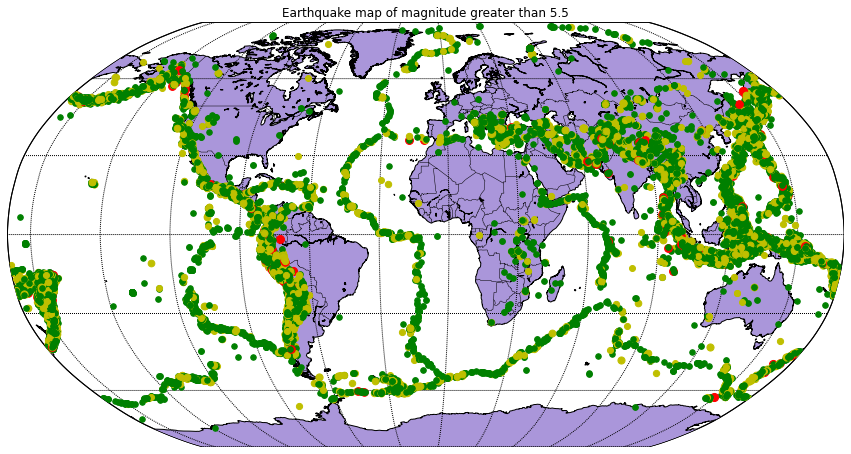

In [16]:
plt.figure(figsize=(15,11))
my_map = Basemap(projection='robin', resolution = 'l', area_thresh = 1000.0, lat_0=0, lon_0=-10)
my_map.drawcoastlines()
my_map.drawcountries()
my_map.fillcontinents(color = '#aa96da')
my_map.drawmapboundary()
my_map.drawmeridians(np.arange(0, 360, 30))
my_map.drawparallels(np.arange(-90, 90, 30))
for lon, lat, mag in zip(data.Longitude, data.Latitude, data.Magnitude):
    x,y = my_map(lon, lat)
    msize = mag
    marker_string = mk_color(mag)
    my_map.plot(x, y, marker_string, markersize=msize)
plt.title("Earthquake map of magnitude greater than 5.5")
plt.savefig('Eq_world.jpeg')
plt.show()

In [18]:
fmap = folium.Map(location=(0,0),zoom_start=2)

In [22]:
for i in range(len(data)):
    folium.Circle(location=[data.iloc[i]['Latitude'],data.iloc[i]['Longitude']],
                  radius=data.iloc[i]['Magnitude']*5000,
                  fill_opacity=0.1
                  ).add_to(fmap)
    
fmap.save("Earthquake_map.html")

In [23]:
fmap